# Exploraiton of PCA for Bias Inspection: CheXpert

In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from sklearn import decomposition
import numpy as np
from scipy import stats
from scipy.spatial import distance
from statsmodels.stats.multitest import multipletests
np.set_printoptions(suppress=True,formatter={'float_kind': '{:f}'.format})
plt.rcParams['figure.dpi'] = 50

In [2]:
# Define constants
alpha = 0.6
style = 'o'
markersize = 40
fontscale = 1.6
color_palette = 'tab10'
kind = 'scatter'
rasterized_scatter = True
out_dpi = 300
out_format = 'png'

In [3]:
MODEL_FEATURES = {
    'resnet18': 512,
    'resnet34': 512,
    'resnet50': 2048,
    'resnet101': 2048,
}
RANDOM_STATE = 42

In [4]:
def create_pca(
        embeds_array: np.ndarray,
        model_df: pd.DataFrame
    ):
    
    # n -> number of samples
    # m -> number of features
    n, m = embeds_array.shape
    pca = decomposition.PCA(n_components=0.99, whiten=False)
    embeds_pca = pca.fit_transform(embeds_array)

    mu = pca.mean_
    U = pca.components_.T
    D = pca.singular_values_**2 / (n - 1)
    exp_var = pca.explained_variance_ratio_

    model_df['PCA Mode 1'] = embeds_pca[:,0]
    model_df['PCA Mode 2'] = embeds_pca[:,1]
    model_df['PCA Mode 3'] = embeds_pca[:,2]
    model_df['PCA Mode 4'] = embeds_pca[:,3]

    # Replace numerical labels with categorical
    model_df['Labels'] = model_df['Labels'].replace({0: 'No finding', 1: 'Other'})
    model_df['Sex'] = model_df['Sex'].replace({0: 'Male', 1: 'Female'})
    model_df['Age'] = model_df['Age'].replace({0: '<60', 1: '60+'})
    model_df['Race'] = model_df['Race'].replace({0: 'White', 1: 'Non-White'})

    print('Explained variance')
    print(exp_var[:4])

In [5]:
def plot(
    label: str,
    df: pd.DataFrame,
    hue_order: list[str],
    model_id: str,
    save_dir: str
):
      
    ### PCA 1 + 2
    x_data = 'PCA Mode 1'
    y_data = 'PCA Mode 2'
    # Scatter with distributions
    sns.set_theme(style="white", palette=color_palette, font_scale=fontscale)
    fig = sns.jointplot(x=x_data, y=y_data, hue=label, kind=kind, alpha=alpha, marker=style, s=markersize, hue_order=hue_order, data=df, joint_kws=dict(rasterized=rasterized_scatter), marginal_kws={'common_norm': False})
    fig.ax_joint.legend(loc='upper right')
    # plt.show()
    plt.savefig(save_dir + 'pca-1+2' + '-' + model_id + '-' + label + '.' + out_format, bbox_inches='tight', dpi=out_dpi)

    # Just distributions
    sns.set_theme(style="white", palette=color_palette, font_scale=fontscale)
    fig, ax = plt.subplots(figsize=(10,3))
    g = sns.kdeplot(x=x_data, hue=label, fill=True, hue_order=hue_order, data=df, ax=ax, common_norm=False)
    g.get_legend().set_title(None)
    g.spines[['right', 'top']].set_visible(False)
    # plt.show()
    plt.savefig(save_dir + 'pca-1' + '-' + model_id + '-' + label + '-marginal.' + out_format, bbox_inches='tight', dpi=out_dpi)

    sns.set_theme(style="white", palette=color_palette, font_scale=fontscale)
    fig, ax = plt.subplots(figsize=(10,3))
    g = sns.kdeplot(x=y_data, hue=label, fill=True, hue_order=hue_order, data=df, ax=ax, common_norm=False)
    g.get_legend().set_title(None)
    g.spines[['right', 'top']].set_visible(False)
    # plt.show()
    plt.savefig(save_dir + 'pca-2' + '-' + model_id + '-' + label + '-marginal.' + out_format, bbox_inches='tight', dpi=out_dpi)

    ### PCA 3 + 4
    x_data = 'PCA Mode 3'
    y_data = 'PCA Mode 4'
    # Scatter with distributions
    sns.set_theme(style="white", palette=color_palette, font_scale=fontscale)
    fig = sns.jointplot(x=x_data, y=y_data, hue=label, kind=kind, alpha=alpha, marker=style, s=markersize, hue_order=hue_order, data=df, joint_kws=dict(rasterized=rasterized_scatter), marginal_kws={'common_norm': False})
    fig.ax_joint.legend(loc='upper right')
    # plt.show()
    plt.savefig(save_dir + 'pca-3+4' + '-' + model_id + '-' + label + '.' + out_format, bbox_inches='tight', dpi=out_dpi)

    # Just distributions
    sns.set_theme(style="white", palette=color_palette, font_scale=fontscale)
    fig, ax = plt.subplots(figsize=(10,3))
    g = sns.kdeplot(x=x_data, hue=label, fill=True, hue_order=hue_order, data=df, ax=ax, common_norm=False)
    g.get_legend().set_title(None)
    g.spines[['right', 'top']].set_visible(False)
    # plt.show()
    plt.savefig(save_dir + 'pca-3' + '-' + model_id + '-' + label + '-marginal.' + out_format, bbox_inches='tight', dpi=out_dpi)

    sns.set_theme(style="white", palette=color_palette, font_scale=fontscale)
    fig, ax = plt.subplots(figsize=(10,3))
    g = sns.kdeplot(x=y_data, hue=label, fill=True, hue_order=hue_order, data=df, ax=ax, common_norm=False)
    g.get_legend().set_title(None)
    g.spines[['right', 'top']].set_visible(False)
    # plt.show()
    plt.savefig(save_dir + 'pca-4' + '-' + model_id + '-' + label + '-marginal.' + out_format, bbox_inches='tight', dpi=out_dpi)
  

In [6]:
def run_statistical_tests(
    df: pd.DataFrame, # model df with PCA columns
    save_dir: str,
):
    
    def stats_tests(marginal, samples):
        df_female = samples[samples['Sex'] == 'Female']
        df_male = samples[samples['Sex'] == 'Male']
        df_young = samples[samples['Age'] == '<60']
        df_old = samples[samples['Age'] == '60+']
        df_white = samples[samples['Race'] == 'White']
        df_non_white = samples[samples['Race'] == 'Non-White']
        df_no_fnd = samples[samples['Labels'] == 'No finding']
        df_other = samples[samples['Labels'] == 'Other']

        res_label = stats.ks_2samp(np.array(df_no_fnd[marginal]), np.array(df_other[marginal]))
        res_age = stats.ks_2samp(np.array(df_young[marginal]), np.array(df_old[marginal]))
        res_sex = stats.ks_2samp(np.array(df_female[marginal]), np.array(df_male[marginal]))
        res_race = stats.ks_2samp(np.array(df_white[marginal]), np.array(df_non_white[marginal]))

        return [res_label.pvalue, res_sex.pvalue, res_age.pvalue, res_race.pvalue]
    
    pvals_pca1 = stats_tests('PCA Mode 1', df)
    pvals_pca2 = stats_tests('PCA Mode 2', df)
    pvals_pca3 = stats_tests('PCA Mode 3', df)
    pvals_pca4 = stats_tests('PCA Mode 4', df)
    pvals = np.array([pvals_pca1, pvals_pca2, pvals_pca3, pvals_pca4])

    # Adjusting for multiple comparisons as we have 16 tests in total.
    res = multipletests(pvals.flatten(), alpha=0.05, method='fdr_by', is_sorted=False, returnsorted=False)

    rejected_null_hypothesis = np.array(res[0]).reshape((4,4))
    adjusted_pvals = np.array(res[1]).reshape((4,4))

    index = ['PCA Mode 1', 'PCA Mode 2', 'PCA Mode 3', 'PCA Mode 4']
    columns_hypothesis = ['label_hypoth','sex_hypoth', 'age_hypoth', 'race_hypoth']
    columns_pvalues = ['label_pv', 'sex_pv', 'age_pv', 'race_pv']

    df_hypothesis = pd.DataFrame(rejected_null_hypothesis, index=index, columns=columns_hypothesis)
    df_pvalues = pd.DataFrame(adjusted_pvals, index=index, columns=columns_pvalues).round(10)
    df = pd.concat([df_hypothesis, df_pvalues], axis=1)
    display(df)
    df.to_csv(save_dir + 'pca-stat.csv', index_label='pca_mode')
    


In [7]:
from scipy.stats import gaussian_kde

def create_sim_table(
    df: pd.DataFrame,
    save_dir: str
):
    
    def js_simlarity(marginal, samples):
        df_female = samples[samples['Sex'] == 'Female']
        df_male = samples[samples['Sex'] == 'Male']
        df_young = samples[samples['Age'] == '<60']
        df_old = samples[samples['Age'] == '60+']
        df_white = samples[samples['Race'] == 'White']
        df_non_white = samples[samples['Race'] == 'Non-White']
        df_no_fnd = samples[samples['Labels'] == 'No finding']
        df_other = samples[samples['Labels'] == 'Other']

        def get_js_distance(data_1, data_2):
            # Generate an array of 1000 values between the min and max of both datasets. This serve as the range over which PDFs will be estimated
            x = np.linspace(min(np.min(data_1), np.min(data_2)), max(np.max(data_1), np.max(data_2)), num=1000)

            # Compute Univariate Kernel Density Estimate for both datasets
            pdf1 = gaussian_kde(data_1)(x)
            pdf2 = gaussian_kde(data_2)(x)

            # Normalise
            pdf1 /= np.sum(pdf1)
            pdf2 /= np.sum(pdf2)

            # To avoid div by 0
            epsilon = 1e-10
            pdf1 += epsilon
            pdf2 += epsilon

            return distance.jensenshannon(pdf1, pdf2, base=2)

        sim_label = get_js_distance(df_no_fnd[marginal], df_other[marginal])
        sim_age = get_js_distance(df_young[marginal], df_old[marginal])
        sim_sex = get_js_distance(df_male[marginal], df_female[marginal])
        sim_race = get_js_distance(df_white[marginal], df_non_white[marginal])

        return [sim_label, sim_sex, sim_age, sim_race]
    
    sim_pca1 = js_simlarity('PCA Mode 1', df)
    sim_pca2 = js_simlarity('PCA Mode 2', df)
    sim_pca3 = js_simlarity('PCA Mode 3', df)
    sim_pca4 = js_simlarity('PCA Mode 4', df)

    index = ['PCA Mode 1', 'PCA Mode 2', 'PCA Mode 3', 'PCA Mode 4']
    columns = ['label similarity', 'sex similarity', 'age similarity', 'race similarity']
    df_sim = pd.DataFrame([sim_pca1, sim_pca2, sim_pca3, sim_pca4], index=index, columns=columns)

    display(df_sim)
    df_sim.to_csv(save_dir + 'pca-sim.csv', index_label='pca_mode')
    
    


In [8]:
def run_pca_and_save_plots(
    model_id: str,
    model_name: str,
    model_dir: str,
    data_name: str, # chexpert_no_female, chexpert_no_old etc.
    sample: bool = False,
    teacher: bool = False,
):
    print(model_id)
    # Load Data
    embeds_data = pd.read_csv(f'{model_dir}/{model_id}/embeds.csv')
    model_df = pd.read_csv(f'{model_dir}/{model_id}/test_predictions.csv')
    embeds = np.array(embeds_data.iloc[:,0:MODEL_FEATURES[model_name]])

    if teacher:
        save_dir = f'teacher_{model_id}/'
    else:
        save_dir = f'{data_name}/{model_id}/'

    if not os.path.exists(save_dir):
        os.makedirs(save_dir)

    create_pca(embeds, model_df)

    if sample:
        # min_num = model_df.groupby(['Labels', 'Age', 'Sex', 'Race']).size().min()

        # # Function to apply that will sample min_num instances from each group
        # def sample_func(group):
        #     return group.sample(min_num)

        # # Apply the function to each group
        # model_df = model_df.groupby(['Labels', 'Age', 'Sex', 'Race']).apply(sample_func).reset_index(drop=True)
        # print(model_df.shape)

        model_df = model_df.sample(frac=0.1, random_state=RANDOM_STATE)

    print('\n--- Statistical tests')
    run_statistical_tests(model_df, save_dir)

    print('\n--- Similarity Table')
    create_sim_table(model_df, save_dir)

    plot(
        label='Labels',
        df=model_df,
        hue_order=['No finding', 'Other'],
        model_id=model_id,
        save_dir=save_dir,
    )

    plot(
        label='Sex',
        df=model_df,
        hue_order=['Male', 'Female'],
        model_id=model_id,
        save_dir=save_dir,
    )

    plot(
        label='Age',
        df=model_df,
        hue_order=['<60', '60+'],
        model_id=model_id,
        save_dir=save_dir,
    )

    plot(
        label='Race',
        df=model_df,
        hue_order=['White', 'Non-White'],
        model_id=model_id,
        save_dir=save_dir,
    )

        

## Fair Teacher - Unfair Students

### Teachers
- name: 'resnet34'
    - random_seed: 43
    - path: '../results/chexpert/resnet/original/'
- name: 'resnet101'
    - random_seed: 46
    - path: '../results/chexpert/resnet/original/'

r34-sam1-s43
Explained variance
[0.572833 0.153879 0.056696 0.033288]

--- Statistical tests


,label_hypoth,sex_hypoth,age_hypoth,race_hypoth,label_pv,sex_pv,age_pv,race_pv
PCA Mode 1,True,False,True,False,0.000000e+00,1.000000e+00,0.0,1.000000e+00
PCA Mode 2,True,True,True,True,0.000000e+00,2.600000e-09,0.0,7.426500e-06
PCA Mode 3,True,True,False,True,1.880000e-08,0.000000e+00,1.0,1.300000e-09
PCA Mode 4,True,False,True,True,0.000000e+00,7.032429e-01,0.0,4.111281e-03



--- Similarity Table


,label similarity,sex similarity,age similarity,race similarity
PCA Mode 1,0.546660,0.049803,0.211707,0.056761
PCA Mode 2,0.311023,0.110534,0.185644,0.100858
PCA Mode 3,0.164828,0.210423,0.054321,0.143491
PCA Mode 4,0.300973,0.060304,0.145730,0.106912


/tmp/ipykernel_2662385/2966415958.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10,3))


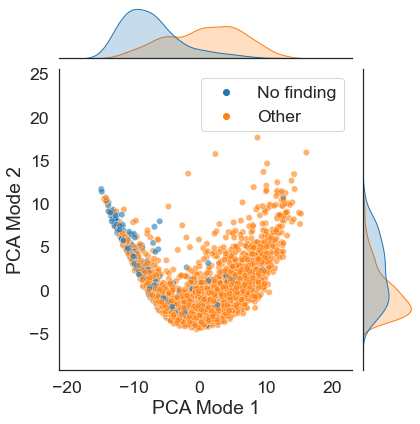

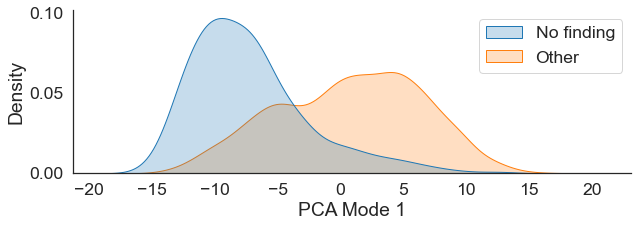

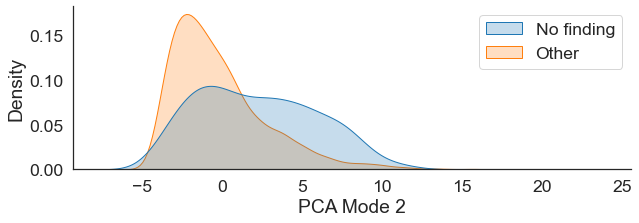

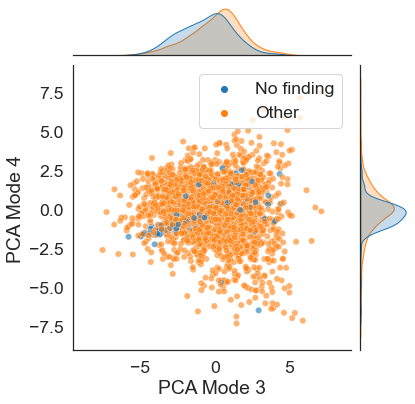

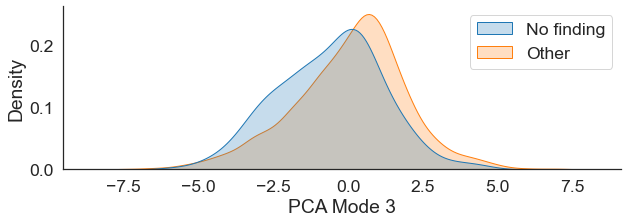

...

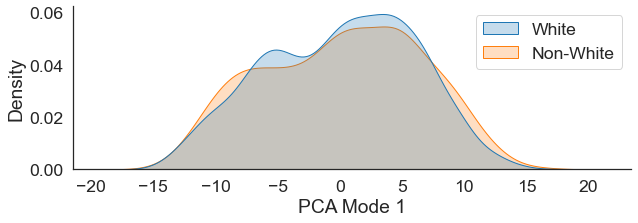

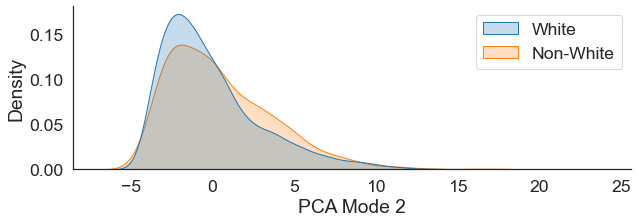

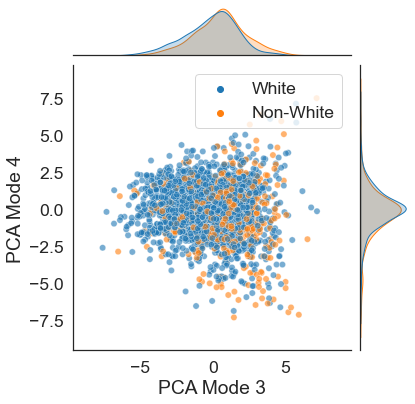

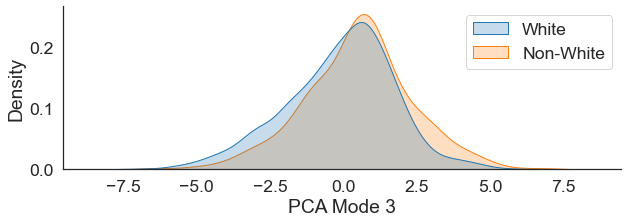

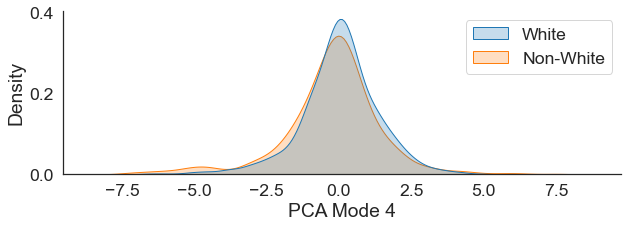

In [9]:
run_pca_and_save_plots(
    model_id='r34-sam1-s43',
    model_name='resnet34',
    model_dir='../../results/chexpert/resnet',
    data_name='chexpert',
    sample=True,
    teacher=True,
)

### Students

#### No Female

##### ResNet18

r18-sam1-kd2-fm0101-s46_r34-sam1-s43


Explained variance
[0.602501 0.186806 0.061078 0.030628]

--- Statistical tests


,label_hypoth,sex_hypoth,age_hypoth,race_hypoth,label_pv,sex_pv,age_pv,race_pv
PCA Mode 1,True,False,True,False,0.000000e+00,1.0,0.00000,1.000000
PCA Mode 2,True,True,True,True,0.000000e+00,0.0,0.00000,0.000090
PCA Mode 3,True,True,True,True,2.099000e-07,0.0,0.00002,0.002831
PCA Mode 4,True,True,True,True,0.000000e+00,0.0,0.00000,0.000000



--- Similarity Table


,label similarity,sex similarity,age similarity,race similarity
PCA Mode 1,0.530898,0.046649,0.195833,0.045039
PCA Mode 2,0.316051,0.123514,0.179668,0.091123
PCA Mode 3,0.195984,0.141369,0.107472,0.072918
PCA Mode 4,0.338958,0.177135,0.145816,0.155354


/tmp/ipykernel_2662385/2966415958.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10,3))


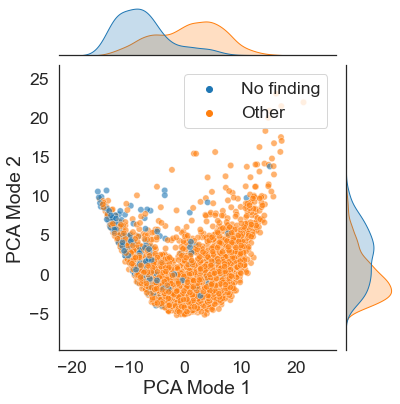

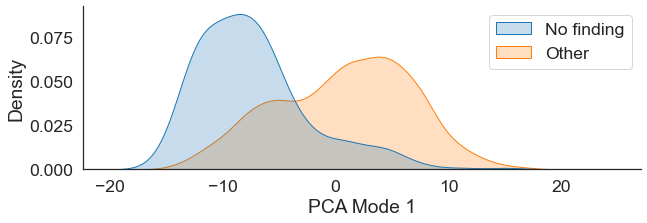

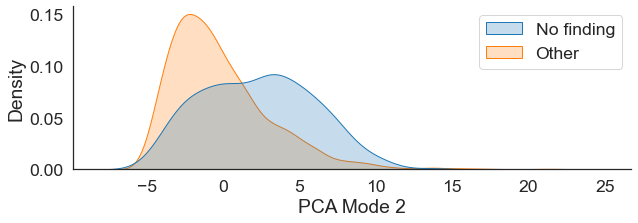

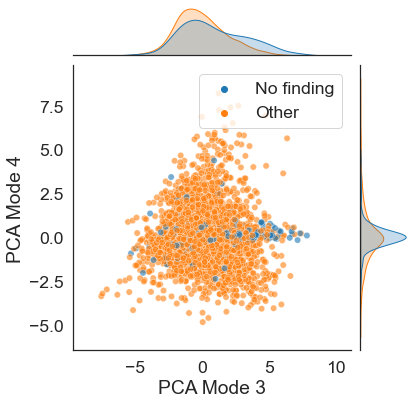

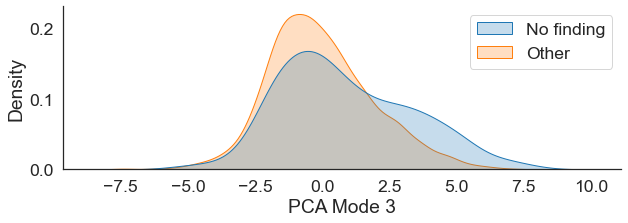

...

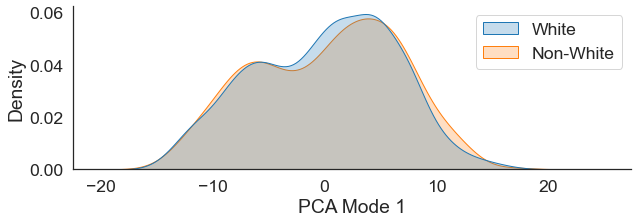

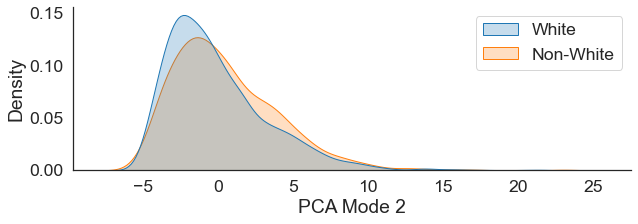

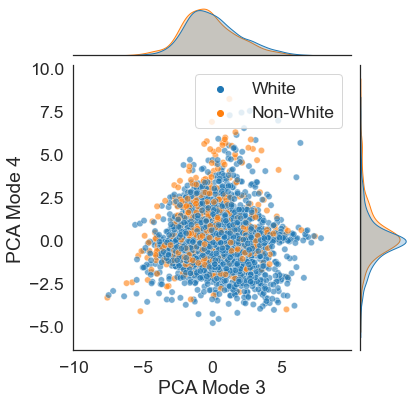

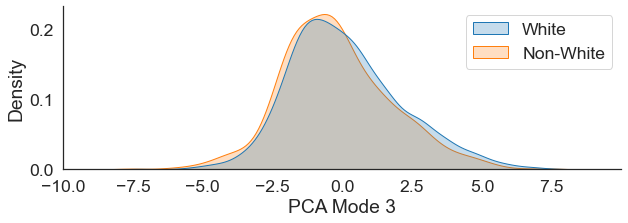

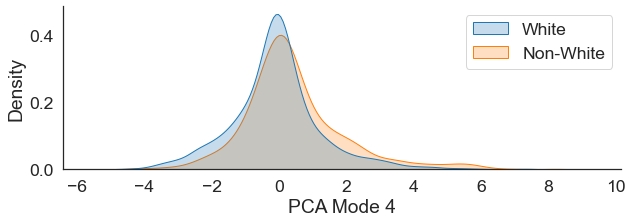

In [10]:
# Resnet18: Seed 46

# Without KD
# run_pca_and_save_plots(
#     model_id='r18-sam1-s46',
#     model_name='resnet18',
#     model_dir='../../results/chexpert_no_female/resnet',
#     data_name='chexpert_no_female',
#     sample=True,
#     teacher=False,
# )

# # With KD
# run_pca_and_save_plots(
#     model_id='r18-sam1-kd1-s46_r34-sam1-s43',
#     model_name='resnet18',
#     model_dir='../../results/chexpert_no_female/kd',
#     data_name='chexpert_no_female',
#     sample=True,
#     teacher=False,
# )

# With FEATURE KD
run_pca_and_save_plots(
    model_id='r18-sam1-kd2-fm0101-s46_r34-sam1-s43',
    model_name='resnet18',
    model_dir='../../results/chexpert_no_female/kd-feature_rgb',
    data_name='chexpert_no_female',
    sample=True,
    teacher=False,
)

##### ResNet34

r34-sam1-kd1-s45_r34-sam1-s43
Explained variance
[0.434653 0.315373 0.066840 0.035668]

--- Statistical tests


,label_hypoth,sex_hypoth,age_hypoth,race_hypoth,label_pv,sex_pv,age_pv,race_pv
PCA Mode 1,True,False,True,False,0.000000,0.493666,0.000000,1.000000
PCA Mode 2,True,True,True,False,0.021196,0.000000,0.000020,0.871556
PCA Mode 3,True,True,True,False,0.000000,0.000081,0.000000,0.397966
PCA Mode 4,True,True,True,True,0.000003,0.000000,0.000001,0.000000



--- Similarity Table


,label similarity,sex similarity,age similarity,race similarity
PCA Mode 1,0.551085,0.043852,0.222934,0.031825
PCA Mode 2,0.106291,0.144949,0.088468,0.044513
PCA Mode 3,0.271491,0.091109,0.177557,0.050108
PCA Mode 4,0.256589,0.259213,0.117164,0.178519


/tmp/ipykernel_2662385/2966415958.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10,3))


r34-sam1-kd2-fm0101-s45_r34-sam1-s43
Explained variance
[0.577432 0.184101 0.060087 0.031900]

--- Statistical tests


,label_hypoth,sex_hypoth,age_hypoth,race_hypoth,label_pv,sex_pv,age_pv,race_pv
PCA Mode 1,True,False,True,False,0.00000,1.000000,0.00000,1.000000e+00
PCA Mode 2,True,True,True,True,0.00000,0.000006,0.00000,2.684610e-05
PCA Mode 3,True,True,True,True,0.00002,0.000000,0.03767,3.269615e-04
PCA Mode 4,True,True,True,True,0.00000,0.000000,0.00000,3.000000e-10



--- Similarity Table


,label similarity,sex similarity,age similarity,race similarity
PCA Mode 1,0.539473,0.042275,0.205922,0.050523
PCA Mode 2,0.315973,0.090026,0.177930,0.092810
PCA Mode 3,0.146251,0.179627,0.061023,0.103813
PCA Mode 4,0.361341,0.183046,0.135544,0.143618


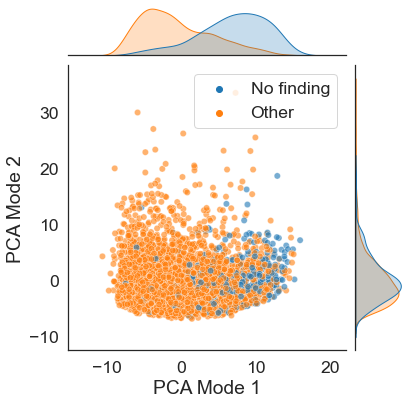

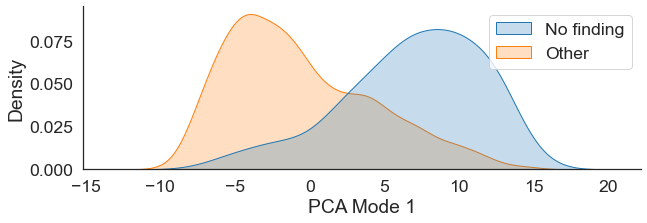

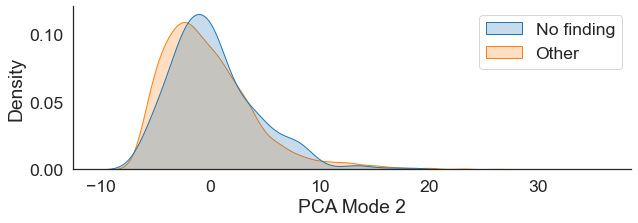

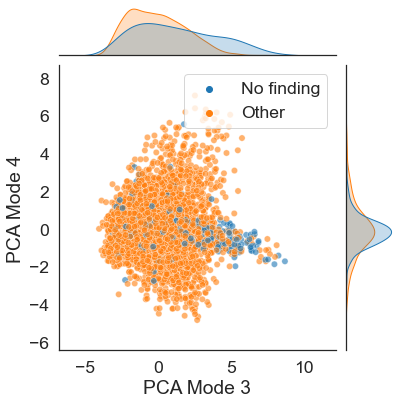

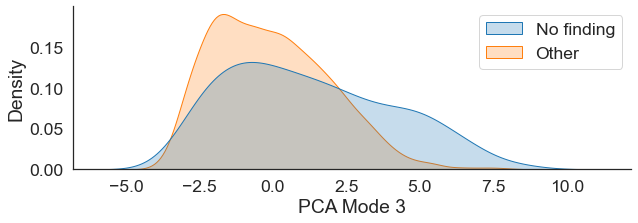

...

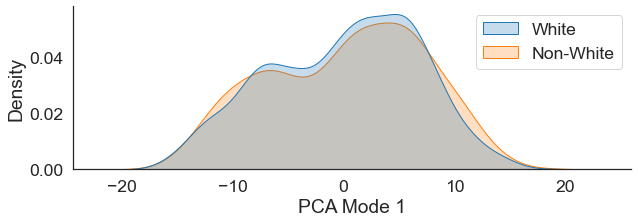

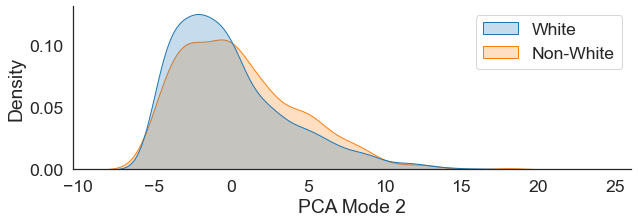

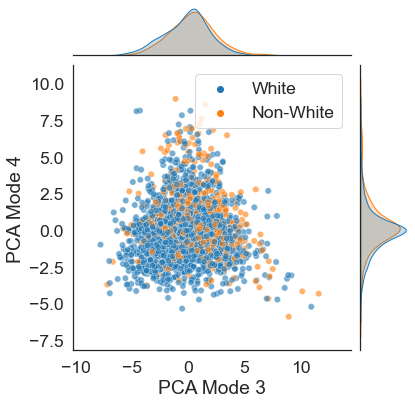

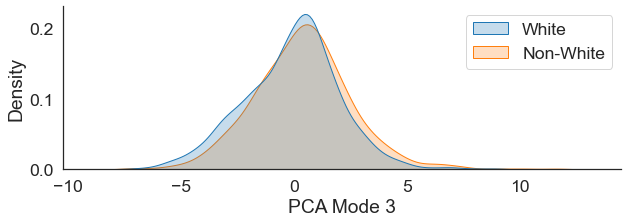

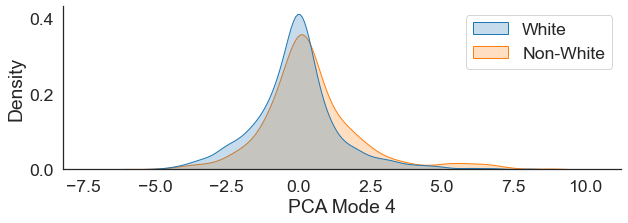

In [11]:
# Resnet34: Seed 45

# Without KD
# run_pca_and_save_plots(
#     model_id='r34-sam1-s45',
#     model_name='resnet34',
#     model_dir='../../results/chexpert_no_female/resnet',
#     data_name='chexpert_no_female',
#     sample=True,
#     teacher=False,
# )

# With KD
run_pca_and_save_plots(
    model_id='r34-sam1-kd1-s45_r34-sam1-s43',
    model_name='resnet34',
    model_dir='../../results/chexpert_no_female/kd',
    data_name='chexpert_no_female',
    sample=True,
    teacher=False,
)

run_pca_and_save_plots(
    model_id='r34-sam1-kd2-fm0101-s45_r34-sam1-s43',
    model_name='resnet34',
    model_dir='../../results/chexpert_no_female/kd-feature_rgb',
    data_name='chexpert_no_female',
    sample=True,
    teacher=False,
)

#### No Old

##### ResNet18

r18-sam1-kd2-fm0101-s46_r34-sam1-s43


Explained variance
[0.627611 0.178378 0.055502 0.029867]

--- Statistical tests


,label_hypoth,sex_hypoth,age_hypoth,race_hypoth,label_pv,sex_pv,age_pv,race_pv
PCA Mode 1,True,False,True,False,0.0,0.411827,0.000000,7.807615e-01
PCA Mode 2,True,True,True,True,0.0,0.000000,0.000000,6.380000e-08
PCA Mode 3,True,True,True,True,0.0,0.000000,0.000025,1.074780e-05
PCA Mode 4,True,False,True,True,0.0,0.145049,0.000000,4.638367e-04



--- Similarity Table


,label similarity,sex similarity,age similarity,race similarity
PCA Mode 1,0.509642,0.072988,0.165927,0.052757
PCA Mode 2,0.340141,0.154620,0.196859,0.115604
PCA Mode 3,0.258552,0.133312,0.114709,0.099876
PCA Mode 4,0.315590,0.079413,0.123842,0.110562


/tmp/ipykernel_2662385/2966415958.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10,3))


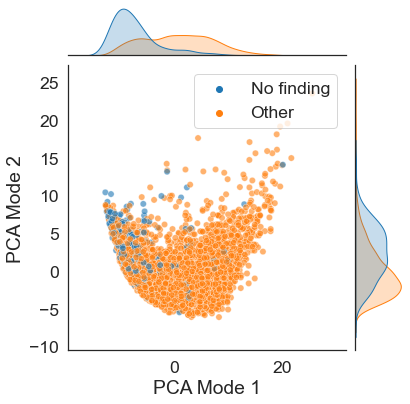

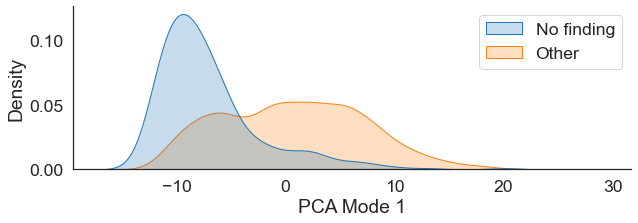

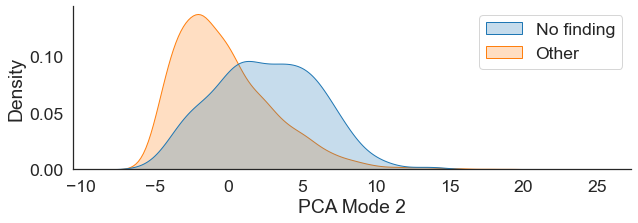

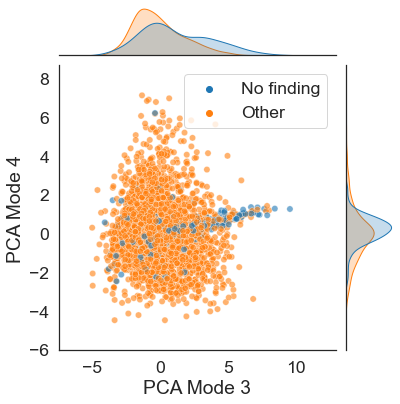

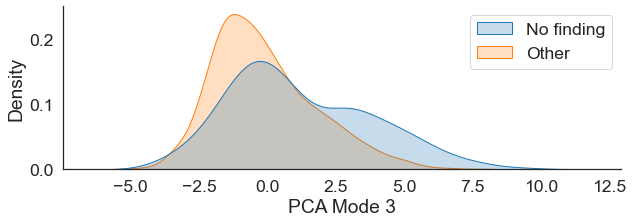

...

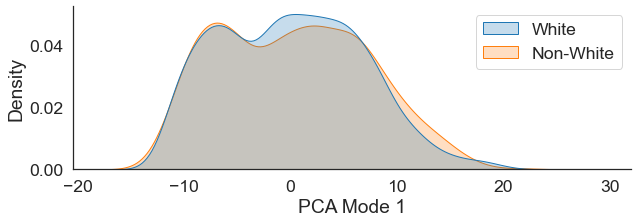

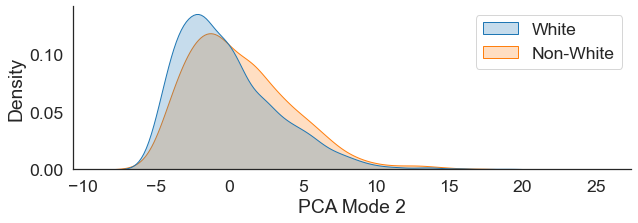

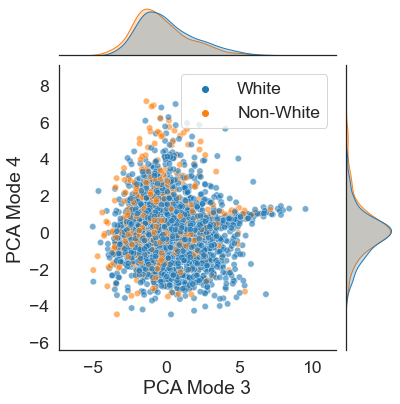

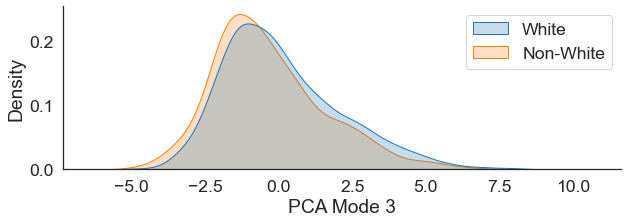

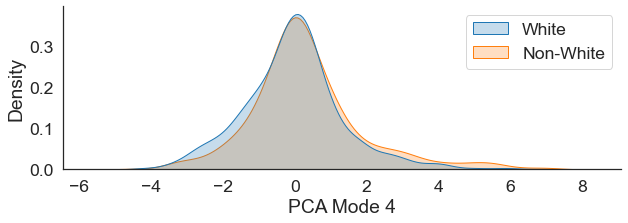

In [12]:
# Resnet18: Seed 46

# Without KD
# run_pca_and_save_plots(
#     model_id='r18-sam1-s46',
#     model_name='resnet18',
#     model_dir='../../results/chexpert_no_old/resnet',
#     data_name='chexpert_no_old',
#     sample=True,
#     teacher=False,
# )

# # With KD
# run_pca_and_save_plots(
#     model_id='r18-sam1-kd1-s46_r34-sam1-s43',
#     model_name='resnet18',
#     model_dir='../../results/chexpert_no_old/kd',
#     data_name='chexpert_no_old',
#     sample=True,
#     teacher=False,
# )

# Feature KD
run_pca_and_save_plots(
    model_id='r18-sam1-kd2-fm0101-s46_r34-sam1-s43',
    model_name='resnet18',
    model_dir='../../results/chexpert_no_old/kd-feature_rgb',
    data_name='chexpert_no_old',
    sample=True,
    teacher=False,
)

##### ResNet34

r34-sam1-kd1-s45_r34-sam1-s43


Explained variance
[0.456303 0.245289 0.061814 0.037515]

--- Statistical tests


,label_hypoth,sex_hypoth,age_hypoth,race_hypoth,label_pv,sex_pv,age_pv,race_pv
PCA Mode 1,True,False,True,False,0.000000,0.391360,0.000000,1.000000
PCA Mode 2,True,True,True,False,0.000079,0.000562,0.000001,0.877927
PCA Mode 3,True,False,True,False,0.000000,0.391360,0.000000,1.000000
PCA Mode 4,True,True,True,True,0.000013,0.000000,0.000000,0.000000



--- Similarity Table


,label similarity,sex similarity,age similarity,race similarity
PCA Mode 1,0.542377,0.033491,0.216312,0.029121
PCA Mode 2,0.128839,0.083201,0.081721,0.038084
PCA Mode 3,0.301113,0.039131,0.196927,0.043624
PCA Mode 4,0.295959,0.265460,0.130374,0.202788


/tmp/ipykernel_2662385/2966415958.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10,3))


r34-sam1-kd2-fm0101-s45_r34-sam1-s43
Explained variance
[0.561501 0.193895 0.063648 0.037215]

--- Statistical tests


,label_hypoth,sex_hypoth,age_hypoth,race_hypoth,label_pv,sex_pv,age_pv,race_pv
PCA Mode 1,True,False,True,False,0.000000e+00,1.000000e+00,0.000000,8.545804e-01
PCA Mode 2,True,True,True,True,0.000000e+00,0.000000e+00,0.000000,3.480200e-06
PCA Mode 3,True,True,True,True,6.000000e-10,1.000000e-10,0.000258,9.702296e-03
PCA Mode 4,True,True,True,True,0.000000e+00,0.000000e+00,0.000000,3.200000e-09



--- Similarity Table


,label similarity,sex similarity,age similarity,race similarity
PCA Mode 1,0.523794,0.054990,0.182703,0.052348
PCA Mode 2,0.357222,0.117654,0.195330,0.097131
PCA Mode 3,0.211573,0.131613,0.090629,0.086811
PCA Mode 4,0.345918,0.136676,0.162948,0.153110


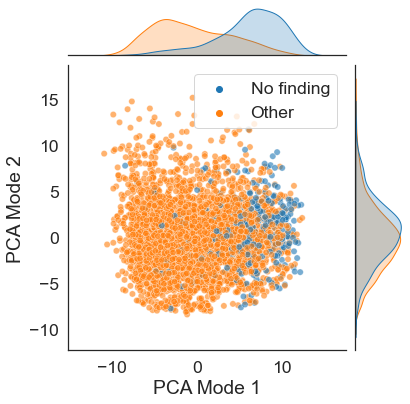

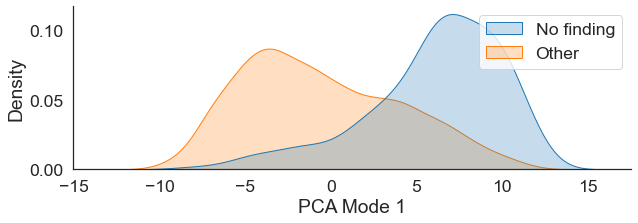

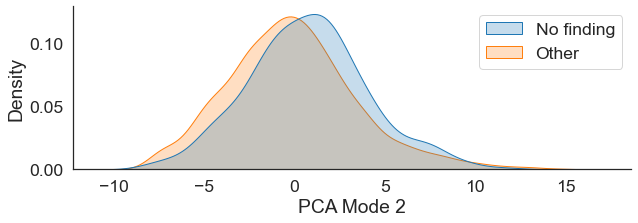

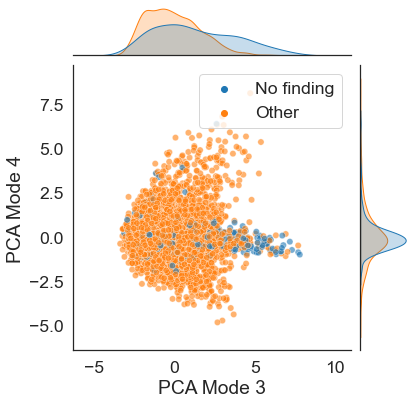

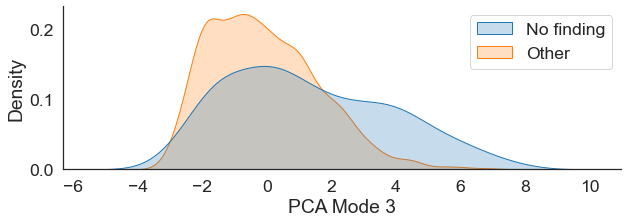

...

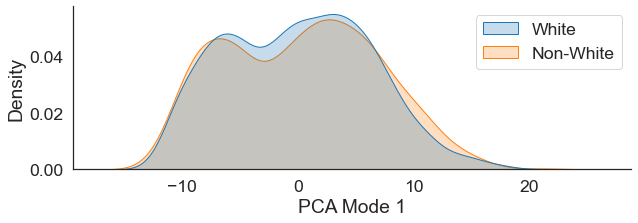

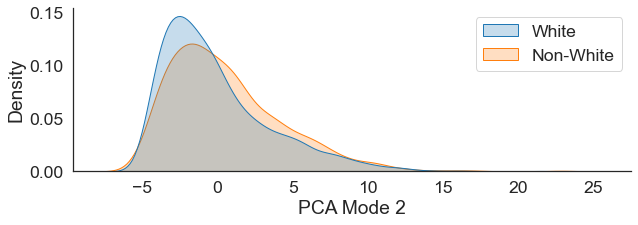

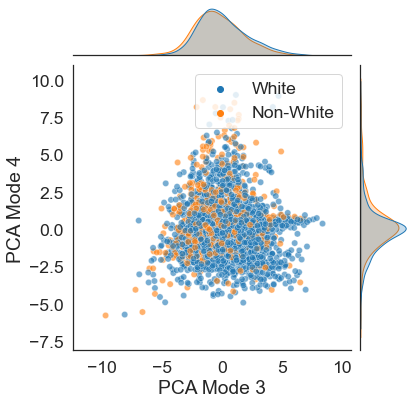

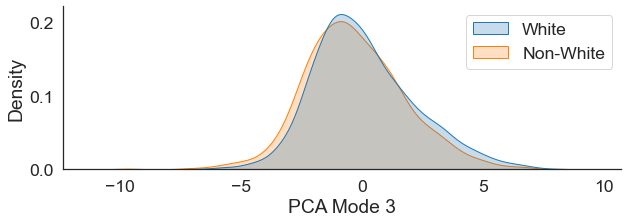

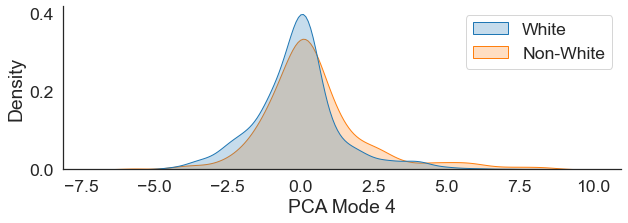

In [13]:
# Resnet34: Seed 45

# Without KD
# run_pca_and_save_plots(
#     model_id='r34-sam1-s45',
#     model_name='resnet34',
#     model_dir='../../results/chexpert_no_old/resnet',
#     data_name='chexpert_no_old',
#     sample=True,
#     teacher=False,
# )

# With KD
run_pca_and_save_plots(
    model_id='r34-sam1-kd1-s45_r34-sam1-s43',
    model_name='resnet34',
    model_dir='../../results/chexpert_no_old/kd',
    data_name='chexpert_no_old',
    sample=True,
    teacher=False,
)

run_pca_and_save_plots(
    model_id='r34-sam1-kd2-fm0101-s45_r34-sam1-s43',
    model_name='resnet34',
    model_dir='../../results/chexpert_no_old/kd-feature_rgb',
    data_name='chexpert_no_old',
    sample=True,
    teacher=False,
)

#### No White

##### ResNet18

r18-sam1-kd2-fm0101-s46_r34-sam1-s43


Explained variance
[0.591291 0.208340 0.059850 0.028596]

--- Statistical tests


,label_hypoth,sex_hypoth,age_hypoth,race_hypoth,label_pv,sex_pv,age_pv,race_pv
PCA Mode 1,True,False,True,False,0.0,1.000000e+00,0.000000,4.442806e-01
PCA Mode 2,True,True,True,True,0.0,0.000000e+00,0.000000,6.851000e-07
PCA Mode 3,True,True,True,True,0.0,1.000000e-10,0.000055,7.599480e-04
PCA Mode 4,True,True,True,True,0.0,0.000000e+00,0.000000,0.000000e+00



--- Similarity Table


,label similarity,sex similarity,age similarity,race similarity
PCA Mode 1,0.523271,0.054112,0.193867,0.058713
PCA Mode 2,0.358361,0.141515,0.206880,0.106323
PCA Mode 3,0.231299,0.129477,0.099061,0.076648
PCA Mode 4,0.346206,0.136684,0.145785,0.143784


/tmp/ipykernel_2662385/2966415958.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10,3))


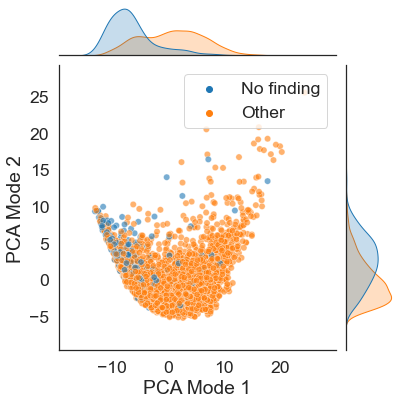

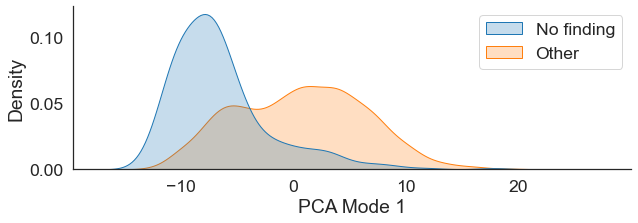

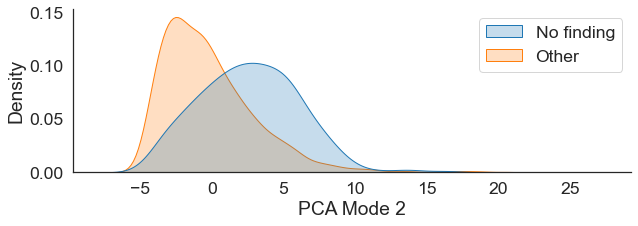

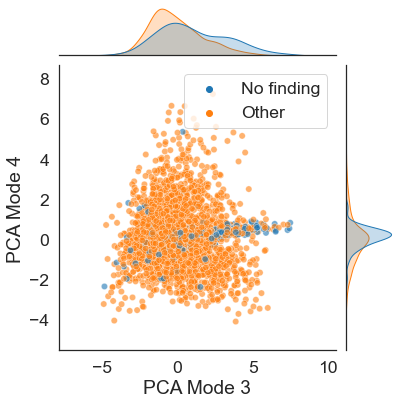

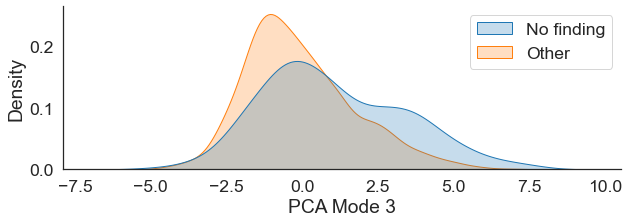

...

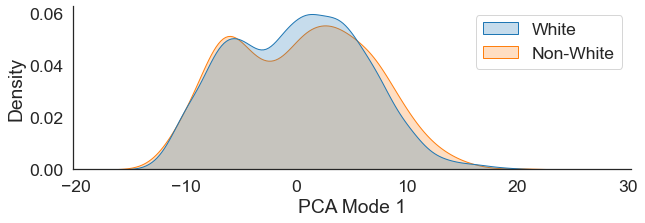

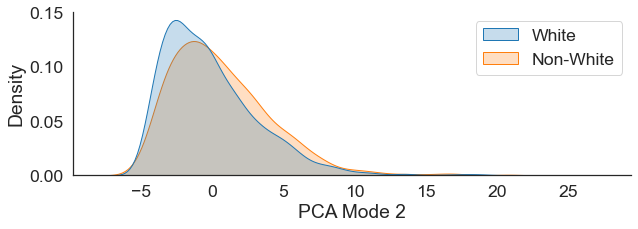

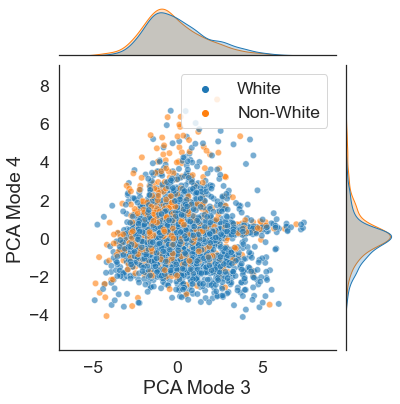

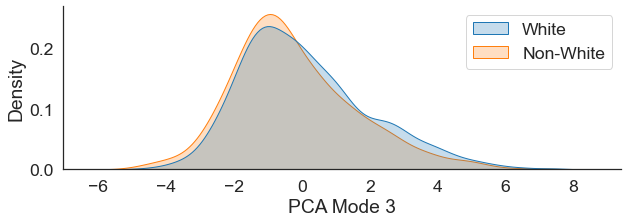

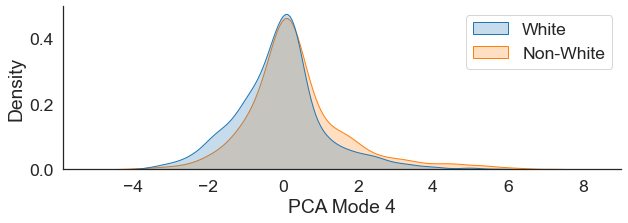

In [14]:
# Resnet18: Seed 46

# Without KD
# run_pca_and_save_plots(
#     model_id='r18-sam1-s46',
#     model_name='resnet18',
#     model_dir='../../results/chexpert_no_white/resnet',
#     data_name='chexpert_no_white',
#     sample=True,
#     teacher=False,
# )

# # With KD
# run_pca_and_save_plots(
#     model_id='r18-sam1-kd1-s46_r34-sam1-s43',
#     model_name='resnet18',
#     model_dir='../../results/chexpert_no_white/kd',
#     data_name='chexpert_no_white',
#     sample=True,
#     teacher=False,
# )

run_pca_and_save_plots(
    model_id='r18-sam1-kd2-fm0101-s46_r34-sam1-s43',
    model_name='resnet18',
    model_dir='../../results/chexpert_no_white/kd-feature_rgb',
    data_name='chexpert_no_white',
    sample=True,
    teacher=False,
)

##### ResNet34

r34-sam1-kd1-s45_r34-sam1-s43
Explained variance
[0.489693 0.058002 0.038999 0.030042]

--- Statistical tests


,label_hypoth,sex_hypoth,age_hypoth,race_hypoth,label_pv,sex_pv,age_pv,race_pv
PCA Mode 1,True,False,True,False,0.000000,0.076593,0.000000,0.529974
PCA Mode 2,True,False,True,False,0.000000,0.231434,0.000000,1.000000
PCA Mode 3,False,True,True,True,0.106449,0.000000,0.000000,0.000000
PCA Mode 4,False,False,True,True,1.000000,1.000000,0.010955,0.009413



--- Similarity Table


,label similarity,sex similarity,age similarity,race similarity
PCA Mode 1,0.533240,0.057024,0.216579,0.037456
PCA Mode 2,0.220138,0.060670,0.153456,0.039823
PCA Mode 3,0.130558,0.288301,0.143611,0.168800
PCA Mode 4,0.073265,0.051536,0.058963,0.063981


/tmp/ipykernel_2662385/2966415958.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10,3))


r34-sam1-kd2-fm0101-s45_r34-sam1-s43
Explained variance
[0.602938 0.183924 0.066293 0.037169]

--- Statistical tests


,label_hypoth,sex_hypoth,age_hypoth,race_hypoth,label_pv,sex_pv,age_pv,race_pv
PCA Mode 1,True,False,True,False,0.000000e+00,5.980599e-01,0.000000,1.000000
PCA Mode 2,True,True,True,True,0.000000e+00,8.100000e-09,0.000000,0.000039
PCA Mode 3,True,True,True,True,2.000000e-10,0.000000e+00,0.000935,0.000002
PCA Mode 4,True,True,True,True,0.000000e+00,2.857048e-02,0.000000,0.000115



--- Similarity Table


,label similarity,sex similarity,age similarity,race similarity
PCA Mode 1,0.534098,0.048630,0.201466,0.042497
PCA Mode 2,0.329024,0.109505,0.188036,0.090837
PCA Mode 3,0.203289,0.177682,0.074998,0.118278
PCA Mode 4,0.341237,0.077553,0.178892,0.112874


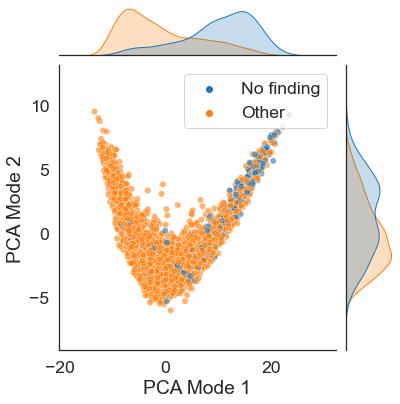

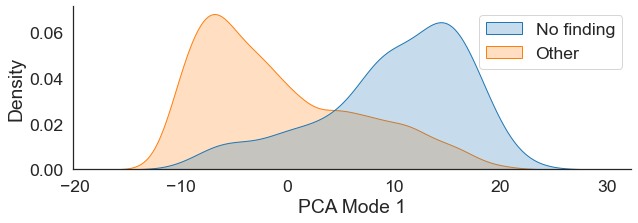

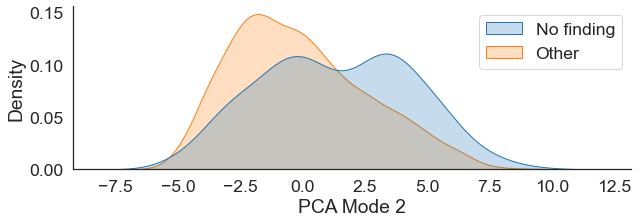

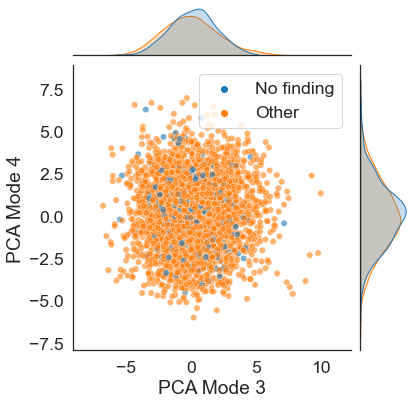

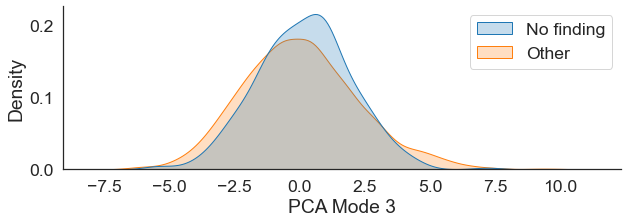

...

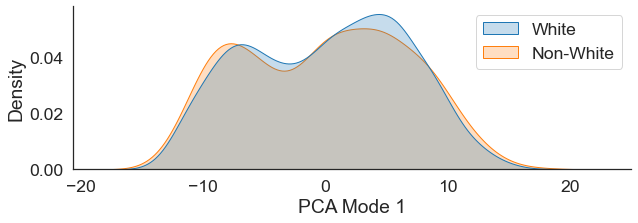

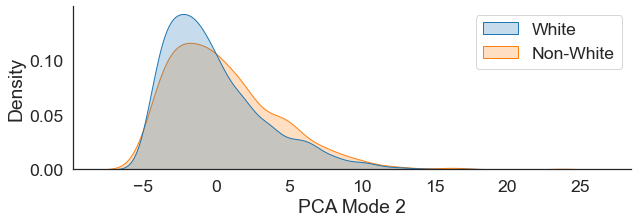

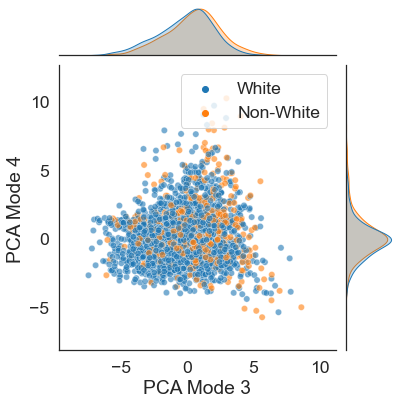

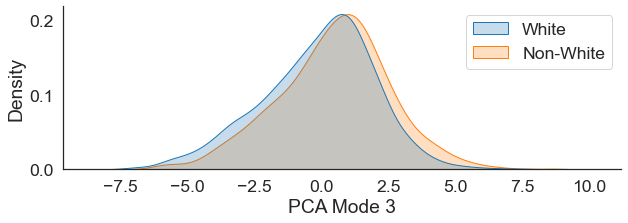

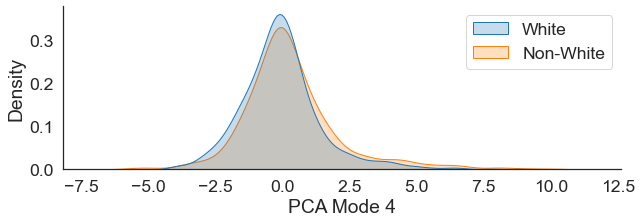

In [15]:
# Resnet34: Seed 45

# Without KD
# run_pca_and_save_plots(
#     model_id='r34-sam1-s45',
#     model_name='resnet34',
#     model_dir='../../results/chexpert_no_white/resnet',
#     data_name='chexpert_no_white',
#     sample=True,
#     teacher=False,
# )

# With KD
run_pca_and_save_plots(
    model_id='r34-sam1-kd1-s45_r34-sam1-s43',
    model_name='resnet34',
    model_dir='../../results/chexpert_no_white/kd',
    data_name='chexpert_no_white',
    sample=True,
    teacher=False,
)

run_pca_and_save_plots(
    model_id='r34-sam1-kd2-fm0101-s45_r34-sam1-s43',
    model_name='resnet34',
    model_dir='../../results/chexpert_no_white/kd-feature_rgb',
    data_name='chexpert_no_white',
    sample=True,
    teacher=False,
)